# Sentiment Analysis 1: Classification

By: Peggy Wang

Used Naive Bayes and Logistic Regression to classify tweets as positive or negative. 

Training Data consists of 160,000 tweets labeled by sentiment from Kaggle: https://www.kaggle.com/kazanova/sentiment140
- Original Kaggle dataset had 1.6 million tweets so just took a random sample. 

In [1]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.naive_bayes import MultinomialNB
import pandas as pd
import json
import os

In [2]:
train = pd.read_csv("train_reduced.csv")

In [3]:
train.describe()

,Sentiment,ID
count,160000.000000,1.600000e+05
mean,0.500000,1.998925e+09
std,0.500002,1.940600e+08
min,0.000000,1.467814e+09
25%,0.000000,1.956848e+09
50%,0.500000,2.002220e+09
75%,1.000000,2.177332e+09
max,1.000000,2.329205e+09


Feature Extraction: Bag of Words Representation

In [4]:
vectorizer = CountVectorizer()
X_train = vectorizer.fit_transform(train["Text"]) #Fit bag of words to tweets text
X_train #takes awhile to run

<160000x136501 sparse matrix of type '<class 'numpy.int64'>'
	with 1897288 stored elements in Compressed Sparse Row format>

In [5]:
vectorizer.get_feature_names()[100000:100004] #look at some words in the representation

['rebcsf', 'rebecaristoff', 'rebecca', 'rebecca_eloise']

# Analysis 1: Naive Bayes Classifier

In [6]:
classifier = MultinomialNB()
#labels: 
y = train["Sentiment"]
classifier.fit(X_train, y)

MultinomialNB()

In [7]:
classifier.classes_ #0 = neg, 1 = pos. 

array([0, 1], dtype=int64)

In [8]:
#import packages for evaluation:
from sklearn.model_selection import cross_validate

In [9]:
#cross validation:
cv_results = cross_validate(classifier, X_train, y, cv=10)

In [10]:
cv_results #test score contains accuracy. 

{'fit_time': array([0.09674072, 0.0638299 , 0.0638299 , 0.08178329, 0.08274126,
        0.06685948, 0.0648284 , 0.06682134, 0.06785631, 0.0638299 ]),
 'score_time': array([0.00598335, 0.00598335, 0.00598335, 0.00598693, 0.0080142 ,
        0.00598955, 0.00598264, 0.00598407, 0.00598383, 0.00598454]),
 'test_score': array([0.7699375, 0.76775  , 0.7640625, 0.7645625, 0.767    , 0.7694375,
        0.7724375, 0.767125 , 0.7633125, 0.7661875])}

In [11]:
#average cross-validation score: 
sum(cv_results["test_score"])/10

0.7671812499999999

Separate into training and testing datasets to look at Confusion Matrix:

In [12]:
#Split into train and test sets (90% train, 10% test)
import random
random.seed(123)
#select 90% of indices for training data:
train_n = int(round(len(train)*0.9, 0))
train_indices = random.sample(range(len(train)), train_n)
train_90 = train.iloc[train_indices,]

#everything that's not in train goes into the testing dataset (10% of total dataset)
test_10 = train.loc[~train.index.isin(train_indices),]

In [13]:
print(len(train_90))
print(len(test_10))

144000
16000


In [14]:
#Feature engineering for train/test sets:
#now build BOW and model with training data, create confusion matrix with test. 

vectorizer = CountVectorizer()
X_train_90 = vectorizer.fit_transform(train_90["Text"]) #Fit bag of words to tweets text
X_train_90 #takes awhile to run

<144000x126600 sparse matrix of type '<class 'numpy.int64'>'
	with 1707020 stored elements in Compressed Sparse Row format>

In [15]:
#only fit the vectorizer with training data (instead of fit_transform)
X_test_10 = vectorizer.transform(test_10["Text"]) #Fit bag of words to tweets text
X_test_10 

<16000x126600 sparse matrix of type '<class 'numpy.int64'>'
	with 180248 stored elements in Compressed Sparse Row format>

In [16]:
#Get actual labels & fit model on split data: 
nb_classifier = MultinomialNB()
y_sample = train_90["Sentiment"]
nb_classifier.fit(X_train_90, y_sample)

MultinomialNB()

In [17]:
#make predictions with test data:
y_predicted = nb_classifier.predict(X_test_10)

In [18]:
#make confusion matrix
import sklearn.metrics
from sklearn.metrics import plot_confusion_matrix

How to get rid of scientific notation: https://stackoverflow.com/questions/60240694/suppress-scientific-notation-in-sklearn-metrics-plot-confusion-matrix

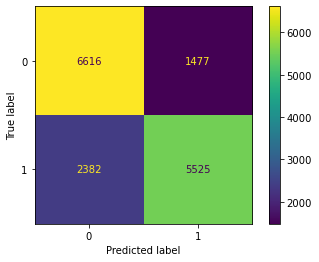

In [19]:
plot_confusion_matrix(nb_classifier, X_test_10 ,test_10["Sentiment"], values_format='.5g')

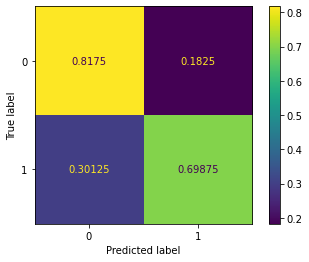

In [20]:
#examine accuracy by percentges:
plot_confusion_matrix(nb_classifier, X_test_10 ,test_10["Sentiment"], values_format='.5g',
                     normalize='true')

# Analysis 2: Logistic Regression

Naive Bayes didn't give the best accuracy. See if Logisitc Regression performs better. 


In [21]:
#see how the logistic model performs with CV: 
from sklearn import linear_model
logistic = linear_model.LogisticRegression(max_iter=500) 

In [22]:
#CV:
cv_results = cross_validate(logistic, X_train, train["Sentiment"], cv=10)
#average cross-validation score: 
sum(cv_results["test_score"])/10

0.7822625000000001

Run model on 90-10 split in order to generate confusion matrices:

In [23]:
logistic = linear_model.LogisticRegression(max_iter=500) 
y_logistic = train_90["Sentiment"]
logistic.fit(X_train_90, y_logistic)

LogisticRegression(max_iter=500)

Logistic regression had trouble converging, probably due to the huge BOW matrix. Needed to increase the maximum number of iterations to 500 (from the default of 100.)
- Converge = performing gradient descent to minimize error

Check CV results and Confusion matrix for the 90-10 split:

In [25]:
#CV:
cv_results = cross_validate(logistic, X_train_90, train_90["Sentiment"], cv=10)

In [26]:
#average cross-validation score: 
sum(cv_results["test_score"])/10

0.7814375

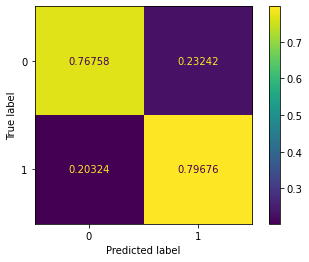

In [27]:
#examine confusion matrix percentages:
plot_confusion_matrix(logistic, X_test_10 ,test_10["Sentiment"], values_format='.5g',
                     normalize='true')

# Prediction with BLM Tweets

Use the Classifiers trained with the whole training set (rather than the 90% split). <br>
The NB classifier is stored in the "classifier" variable, from code above. <br>
The Logistic classifier is stored in the "logistic variable"<br>

In [44]:
#reset the vectorizer to transform full training data
X_train = vectorizer.fit_transform(train["Text"]) #Fit bag of words to tweets text
X_train.shape #takes awhile to run

(160000, 136501)

In [45]:
#refit logistic classifier with whole training set. 
y_logistic = train["Sentiment"]
logistic.fit(X_train, y_logistic)

LogisticRegression(max_iter=500)

In [46]:
#read in dataset
tweets = pd.read_csv("capstone_data.csv")

In [47]:
tweets.head()

,username,to,text,retweets,favorites,replies,id,permalink,author_id,date,formatted_date,mentions,hashtags,urls,hashtag,short_date
0,TheLivesThatMtr,NaN,"Say their name. Jeray Chatham, 2015-11-17 #Bla...",0,0,-1,1116504927659024384,https://twitter.com/TheLivesThatMtr/status/111...,750929688546123776,2019-04-12 00:54:53+00:00,Fri Apr 12 00:54:53 +0000 2019,NaN,#BlackLivesMatter,NaN,#blacklivesmatter,2019-04-12
1,DJBenhop,bmsmovement,@bmsmovement “The Mouth Of The South” from 7-9...,0,0,-1,1116502771212144640,https://twitter.com/DJBenhop/status/1116502771...,36873668,2019-04-12 00:46:18+00:00,Fri Apr 12 00:46:18 +0000 2019,bmsmovement,#realtalk #education #knowledge #blacklivesmat...,https://t.co/ss8LlxYPus https://t.co/G2LFdcsUq7,#blacklivesmatter,2019-04-12
2,cedteaches,NaN,Anyone want to check out dad's history and pre...,0,0,-1,1116502774823493633,https://twitter.com/cedteaches/status/11165027...,309833404,2019-04-12 00:46:19+00:00,Fri Apr 12 00:46:19 +0000 2019,NaN,#blackchurches #BlackLivesMatter #Louisiana,https://t.co/hIa8eGay5i,#blacklivesmatter,2019-04-12
3,In2TheSunshine2,NYDailyNews,@NYDailyNews RIP young man. Memo to those who ...,0,1,-1,1116504552130457607,https://twitter.com/In2TheSunshine2/status/111...,406566256,2019-04-12 00:53:23+00:00,Fri Apr 12 00:53:23 +0000 2019,NYDailyNews,#BlackLivesMatter #NipseyHussleCelebrationOfLife,NaN,#blacklivesmatter,2019-04-12
4,Megnosah,NaN,man i wish there was more of America feel free...,0,0,-1,1116491116793167874,https://twitter.com/Megnosah/status/1116491116...,3036471893,2019-04-12 00:00:00+00:00,Fri Apr 12 00:00:00 +0000 2019,NaN,#blacklivesmatter,NaN,#blacklivesmatter,2019-04-12


In [48]:
tweets.columns

Index(['username', 'to', 'text', 'retweets', 'favorites', 'replies', 'id',
       'permalink', 'author_id', 'date', 'formatted_date', 'mentions',
       'hashtags', 'urls', 'hashtag', 'short_date'],
      dtype='object')

In [49]:
tweets["hashtag"].value_counts() 

#blacklivesmatter    99792
#blm                 33912
#sayhername          12978
Name: hashtag, dtype: int64

Create a separate dataframe for each hashtag`

In [33]:
sayhername = tweets[tweets["hashtag"]=="#sayhername"]
#reset index to 0, don't want to preserve original indexing. this is to make sure the prediction indices match. 
sayhername = sayhername.reset_index() 

In [34]:
blm = tweets[tweets["hashtag"]=="#blm"]
blm = blm.reset_index()

In [35]:
blacklivesmatter = tweets[tweets["hashtag"]=="#blacklivesmatter"]
blacklivesmatter = blacklivesmatter.reset_index()

Convert all tweets in each dataframe to BOW representation: 

In [50]:
#need to vectorize each dataset: MAKE SURE TO USE THE SAME VECTORIZER AS TRAINING SET: ONLY TRANSFORM1!!

X_sayhername = vectorizer.transform(sayhername["text"])
X_blm = vectorizer.transform(blm["text"])
X_blacklivesmatter = vectorizer.transform(blacklivesmatter["text"])


In [51]:
X_blm.shape #look at dimensions of the matrix representation. Make sure number of columns match X_train

(33912, 136501)

### Predict Sentiment of BLM Tweets using Logistic Regression

In [52]:
#logistic regression predict functions return matrices so change prediction results into dataframe:
def predict_df(X):
    probs = logistic.predict_proba(X)
    pred_labels = logistic.predict(X)
    df = pd.DataFrame({"neg_prob" : probs[:,0], "pos_prob":probs[:,1], "predicted": pred_labels})
    return df

In [53]:
predictions_shn = predict_df(X_sayhername) #output is a matrix (np array, nx2)

In [54]:
predictions_shn.head() #first column is P(class 0) = P(negative), second column is P(class 1) = P(positive)

,neg_prob,pos_prob,predicted
0,0.061484,0.938516,1
1,0.422825,0.577175,1
2,0.360319,0.639681,1
3,0.857782,0.142218,0
4,0.890903,0.109097,0


In [55]:
predictions_blm = predict_df(X_blm)

In [56]:
predictions_blacklivesmatter = predict_df(X_blacklivesmatter)

Visualize the distirbution of predictions. 

In [57]:
import plotly.express as px

In [58]:
px.histogram(predictions_shn["pos_prob"],labels=dict(value="P(sentiment is positive)"))

In [59]:
px.histogram(predictions_blm["pos_prob"], labels=dict(value="P(sentiment is positive)"))

In [60]:
px.histogram(predictions_blacklivesmatter["pos_prob"], labels=dict(value="P(sentiment is positive)"))

Noticed extreme peaks at certain predicted values for sentiment. Took a look at the texts and found that:

- none of the tweets were necessarily positive. 

- a lot of them only contained hashtags/links. Very few full sentences in general, so maybe the classifier is struggling with hashtags (all of them contain #sayhername (not case sensitive) due to nature of data collected) 

- classifier has low accuracy. This might be because training data is too variable, since the tweets are just a random assortment across all topics. 

- lots of them contained links

To try to improve results, I removed tweets that are very short (2 words or fewer) because these often only contained hashtags and links. Filter out short tweets and re-run analysis: 

In [61]:
filtered1 = sayhername.apply(lambda row: len(row["text"].split()) > 2, axis=1)
sayhername_trim = sayhername.loc[filtered1,]

In [62]:
len(sayhername_trim)

12156

In [63]:
X_shn_trim = vectorizer.transform(sayhername_trim["text"]) #feature engineering

In [64]:
predicted_shn_trim = predict_df(X_shn_trim) #make predictions with trimmed dataset

In [65]:
#visualize:
import seaborn

Text(0.5, 1.0, 'Predicted Sentiment for #sayhername')

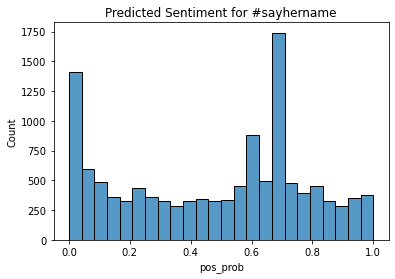

In [66]:
seaborn.histplot(predicted_shn_trim["pos_prob"]).set_title("Predicted Sentiment for #sayhername")

The peaks/modes are still present for >= 3 words. I found that the longer I required tweets to be, the lower the peaks became, so the logistic classifier probably performs better on longer tweets.

Repeat the analysis, using filtered tweets, for the other 2 hashtags.

In [67]:
filtered2 = blm.apply(lambda row: len(row["text"].split()) > 2, axis=1)
blm_trim = blm.loc[filtered2,]
X_blm_trim = vectorizer.transform(blm_trim["text"])
predicted_blm_trim = predict_df(X_blm_trim)

Text(0.5, 1.0, 'Predicted Sentiment for #blm')

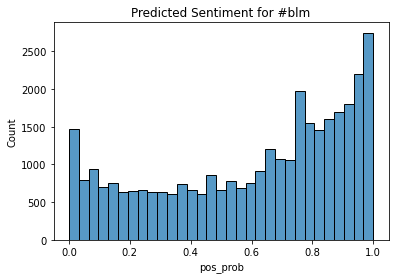

In [68]:
seaborn.histplot(predicted_blm_trim["pos_prob"]).set_title("Predicted Sentiment for #blm")

In [69]:
filtered3 = blacklivesmatter.apply(lambda row: len(row["text"].split()) > 2, axis=1)
blacklivesmatter_trim = blacklivesmatter.loc[filtered3,]
X_blacklivesmatter_trim = vectorizer.transform(blacklivesmatter_trim["text"])
predicted_blacklivesmatter_trim = predict_df(X_blacklivesmatter_trim)

Text(0.5, 1.0, 'Predicted Sentiment for #blacklivesmatter')

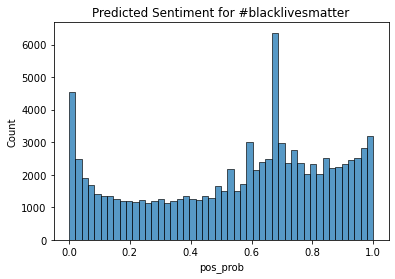

In [70]:
seaborn.histplot(predicted_blacklivesmatter_trim["pos_prob"]).set_title("Predicted Sentiment for #blacklivesmatter")

### Predict with Naive Bayes

Since the training accuracy wasn't too different between the 2 classifiers, make predictions with Naive Bayes as well to compare. 

In [71]:
#convert matrix of predictions into data frame
def nb_predict_df(X):
    probs = classifier.predict_proba(X)
    pred_labels = classifier.predict(X)
    df = pd.DataFrame({"neg_prob" : probs[:,0], "pos_prob":probs[:,1], "predicted": pred_labels})
    return df

In [72]:
nb_predicted_blm_trim = nb_predict_df(X_blm_trim)

In [73]:
nb_predicted_blm_trim["predicted"].value_counts()

1    21317
0    12224
Name: predicted, dtype: int64

In [74]:
nb_predicted_shn_trim = nb_predict_df(X_shn_trim)

In [75]:
nb_predicted_shn_trim["predicted"].value_counts()

0    6734
1    5422
Name: predicted, dtype: int64

In [76]:
nb_predicted_blacklivesmatter_trim = nb_predict_df(X_blacklivesmatter_trim)

In [77]:
nb_predicted_blacklivesmatter_trim["predicted"].value_counts()

1    54389
0    42128
Name: predicted, dtype: int64

Text(0.5, 1.0, 'NB Predicted Sentiment for #blacklivesmatter')

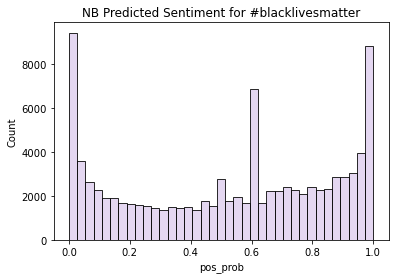

In [78]:
#viualize:
seaborn.histplot(nb_predicted_blacklivesmatter_trim["pos_prob"], 
                 color="#dbcaed").set_title("NB Predicted Sentiment for #blacklivesmatter")

Text(0.5, 1.0, 'NB Predicted Sentiment for #blm')

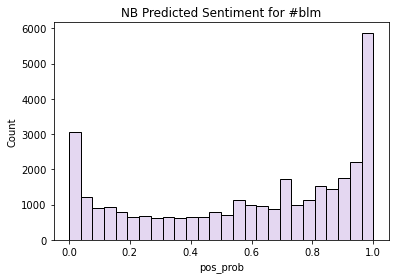

In [79]:
seaborn.histplot(nb_predicted_blm_trim["pos_prob"], color="#dbcaed").set_title("NB Predicted Sentiment for #blm")

Text(0.5, 1.0, 'NB Predicted Sentiment for #sayhername')

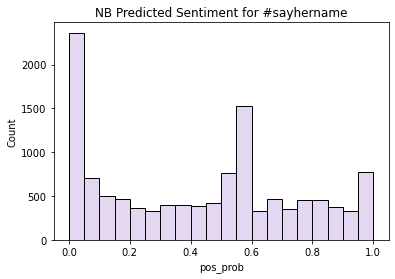

In [80]:
seaborn.histplot(nb_predicted_shn_trim["pos_prob"], color="#dbcaed").set_title("NB Predicted Sentiment for #sayhername")

<b> Results: </b> We still see these random peaks in the histogram. Also, no way to verify testing accuracy since the test data isn't labeled. 

Impossible to manually label everything, but I decided to label a subset of 100 tweets from each hashtag just to see how the classifier's results compared with mine. 

# Predictions with Maually Labeled Sample

In [81]:
shn_sample = pd.read_csv("sayhername_sample.csv", encoding="ISO-8859-1")
#contain some non-ascii characters so needed to change encoding

In [82]:
blm_sample = pd.read_csv("blm_sample.csv",encoding="ISO-8859-1" )

In [83]:
blacklives_sample = pd.read_csv("blacklivesmatter_sample.csv",encoding="ISO-8859-1" )

In [84]:
#tokenize: 
X_1 = vectorizer.transform(shn_sample["text"])

In [85]:
X_2 = vectorizer.transform(blm_sample["text"])

In [86]:
X_3 = vectorizer.transform(blacklives_sample["text"])

Problem: I manually labeled tweets as either negative, neutral, or positive but the classifiers are binary. I did this because the pre-built packages in the second part of the analysis predicts sentiment on a spectrum from -1 to 1.  I experimented with labeling neutral tweets as all positive or all negative and compared the results. 

### Attempt 1: Label all neutral tweets as negative

In [87]:
shn_sample["sentiment_label"] = shn_sample["sentiment"] #clone labels
shn_sample.loc[shn_sample["sentiment"]==-1, "sentiment_label"] = 0 #recode to match classifiers.

In [88]:
blm_sample["sentiment_label"] = blm_sample["sentiment"] #clone labels
blm_sample.loc[blm_sample["sentiment"]==-1, "sentiment_label"] = 0 #recode to match classifiers.

In [89]:
blacklives_sample["sentiment_label"] = blacklives_sample["sentiment"] #clone labels
blacklives_sample.loc[blacklives_sample["sentiment"]==-1, "sentiment_label"] = 0 #recode to match classifiers.

In [90]:
import sklearn.metrics
from sklearn.metrics import plot_confusion_matrix

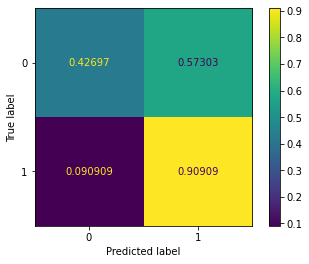

In [91]:
plot_confusion_matrix(logistic, X_1 ,shn_sample["sentiment_label"], values_format='.5g',
                      normalize='true')

We see a very high proportion of False Positives (true label is negative, predicted positive)

### Attempt 2: Label all neutral tweets as positive

In [92]:
shn_sample.loc[shn_sample["sentiment"]==0, "sentiment_label"] = 1  #recode to match classifiers.
blm_sample.loc[blm_sample["sentiment"]==0, "sentiment_label"] = 1  
blacklives_sample.loc[blacklives_sample["sentiment"]==0, "sentiment_label"] = 1 

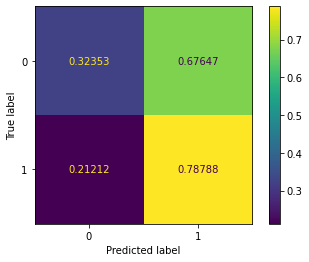

In [93]:
plot_confusion_matrix(logistic, X_2 ,blm_sample["sentiment_label"], values_format='.5g',
                      normalize='true')

Oddly enough, there is still a very high proportion of False Positives. This suggests that the logistic classifier is biased towards labeling tweets as positive. 

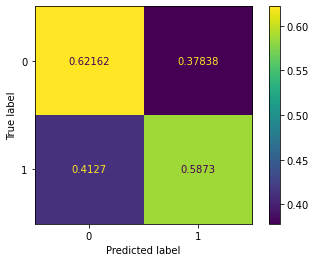

In [94]:
plot_confusion_matrix(classifier, X_1 ,shn_sample["sentiment_label"], values_format='.5g',
                      normalize='true')

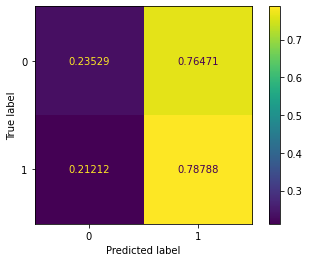

In [95]:
plot_confusion_matrix(classifier, X_2 ,blm_sample["sentiment_label"], values_format='.5g',
                      normalize='true')

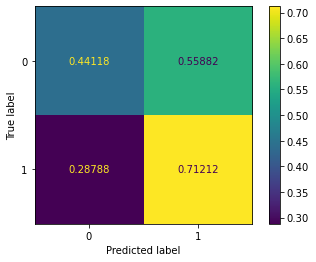

In [96]:
plot_confusion_matrix(classifier, X_3 ,blacklives_sample["sentiment_label"], values_format='.5g',
                      normalize='true')

Naive Bayes had a very high rate of false positives for #blm and #blacklives matter, but less for #sayhername, if all neutral tweets were labeled positive. 

## Calculating Accuracy


Going back to my original labels, I predicted the sentiment of each row with both classifiers. I designated the predicted label of the classifier to be neutral if the probability of being positive was closer to 0.5 than to 0 or 1. 

In [97]:
#restore the neutral labels 
for df in [shn_sample, blm_sample, blacklives_sample]:
    df.loc[df["sentiment"]== 0, "sentiment_label"] = 0.5

In [98]:
#Make predictions with logistic regression and define pos_prob to be the probabiltiy that a tweet is positive 

In [99]:
log_pred1 = logistic.predict_proba(X_1)
log_pred2 = logistic.predict_proba(X_2)
log_pred3 = logistic.predict_proba(X_3)

In [100]:
shn_sample["pos_prob"] = log_pred1[:, 1] #probability of being in class 1

In [101]:
blm_sample["pos_prob"] = log_pred2[:, 1] #probability of being in class 1

In [102]:
blacklives_sample["pos_prob"] = log_pred3[:, 1] #probability of being in class 1

In [103]:
def check_match(row, y):
    """ Helper function to compare predicted and actual (my own) labels 
    map predicted probabilities to 3 categories rather than 2, 
    with P(class1) = 0.5 as the neutral class. """
    score = y
    #see if prediction is closest to 0, 0.5 or 1 (neg, neu, pos, respectively. )
    neg = abs(0-score)
    neu = abs(0.5-score)
    pos = abs(1-score)
    
    pred_label = -1
    #find the category with the smallest difference. 
    smallest_diff = min(neg, neu, pos)
    if smallest_diff==pos:
        pred_label = 1
    elif smallest_diff ==neu:
        pred_label =  0.5
    else:
        pred_label = 0
        
    #check if predicted label matches actual: 
    return pred_label == row["sentiment_label"]

Calculate the percentage accuracy of predictions for each hashtag

In [104]:
for df in [shn_sample, blm_sample, blacklives_sample]:
    #list of booleans indicating whether each row is predicted "correctly"
    match_states = df.apply(lambda x: check_match(x, x["pos_prob"]), axis=1).to_list()
    print(df["hashtag"].iloc[0], sum(match_states)/len(match_states))

#sayhername 0.54
#blm 0.35
#blacklivesmatter 0.39


Repeat for Naive Bayes

In [105]:
nb_pred1 = classifier.predict_proba(X_1)
nb_pred2 = classifier.predict_proba(X_2)
nb_pred3 = classifier.predict_proba(X_3)


In [106]:
shn_sample["nb_prob"] = nb_pred1[:, 1] #probability of being in class 1
blm_sample["nb_prob"] = nb_pred2[:, 1] 
blacklives_sample["nb_prob"] = nb_pred3[:, 1] 

In [107]:
for df in [shn_sample, blm_sample, blacklives_sample]:
    match_states = df.apply(lambda x: check_match(x, x["nb_prob"]), axis=1).to_list()
    print(df["hashtag"].iloc[0], sum(match_states)/len(match_states))

#sayhername 0.47
#blm 0.31
#blacklivesmatter 0.38


From the low test accuracies, we see that these 2 classifiers are not the best at predicting sentiment. Next, repeat the analysis using existing sentiment libraries. 